In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from dataclasses import dataclass
import json
import os
from pathlib import Path
from pprint import pprint
import sys
if '..' not in sys.path:
    sys.path.append('..')
import shutil
import traceback
from typing import Union, Any, Optional
import yaml

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from sdp.ds.bop_data import read_models_info, read_scene_camera, read_scene_gt, \
    read_scene_gt_info
from sdp.ds.bop_dataset import BopDataset

In [5]:
DATA_PATH = Path(os.path.expandvars('$HOME/data'))
BOP_PATH = DATA_PATH / 'bop'
SDP_PATH = DATA_PATH / 'sdp'
ITODD_SUBDIR = 'itodd'
ITODD_BOP_PATH = BOP_PATH / ITODD_SUBDIR
ITODD_SDP_PATH = SDP_PATH / ITODD_SUBDIR
print(f'BOP path: {BOP_PATH}')
print(f'SDP path: {SDP_PATH}')

BOP path: /Users/misha/data/bop
SDP path: /Users/misha/data/sdp


In [5]:
models_info_fpath = ITODD_BOP_PATH / 'models' / 'models_info.json'
models_info = read_models_info(models_info_fpath)
models_info

{1: BopModelInfo(model_id=1, diameter=64.0944, pt_min=array([-25.5  , -22.639, -10.759]), pt_max=array([25.5  , 22.639, 10.759]), size=array([51.   , 45.278, 21.518]), syms_discrete=[], syms_continuous=[]),
 2: BopModelInfo(model_id=2, diameter=51.4741, pt_min=array([-25.4979, -23.0174,  -8.    ]), pt_max=array([25.4979, 23.0174,  8.    ]), size=array([50.9959, 46.0347, 16.    ]), syms_discrete=[array([[-0.5     , -0.866025,  0.      ,  4.62856 ],
        [ 0.866025, -0.5     ,  0.      ,  8.0169  ],
        [ 0.      ,  0.      ,  1.      ,  0.      ],
        [ 0.      ,  0.      ,  0.      ,  1.      ]]), array([[-0.5     ,  0.866025,  0.      , -4.62856 ],
        [-0.866025, -0.5     ,  0.      ,  8.0169  ],
        [ 0.      ,  0.      ,  1.      ,  0.      ],
        [ 0.      ,  0.      ,  0.      ,  1.      ]])], syms_continuous=[]),
 3: BopModelInfo(model_id=3, diameter=142.15, pt_min=array([-52. , -41.2, -25.5]), pt_max=array([52. , 41.2, 25.5]), size=array([104. ,  82.4,  5

In [6]:
bop_ds_path = ITODD_BOP_PATH / 'train_pbr'
scenes_paths = list(bop_ds_path.iterdir())
scenes_paths.sort()
print(scenes_paths[:5])

[PosixPath('/Users/misha/data/bop/itodd/train_pbr/000000'), PosixPath('/Users/misha/data/bop/itodd/train_pbr/000001'), PosixPath('/Users/misha/data/bop/itodd/train_pbr/000002'), PosixPath('/Users/misha/data/bop/itodd/train_pbr/000003'), PosixPath('/Users/misha/data/bop/itodd/train_pbr/000004')]


In [7]:
scene_path = scenes_paths[0]
scene_camera_fpath = scene_path / 'scene_camera.json'
scene_camera = read_scene_camera(scene_camera_fpath)
scene_camera

{0: BopSceneCameraEntry(scene_id=0, K=array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
        [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]), depth_scale=0.1),
 1: BopSceneCameraEntry(scene_id=1, K=array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
        [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]), depth_scale=0.1),
 2: BopSceneCameraEntry(scene_id=2, K=array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
        [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]), depth_scale=0.1),
 3: BopSceneCameraEntry(scene_id=3, K=array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
        [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]), depth_scale=0.1),
 4: BopSceneCameraEntry(scene_id=4, K=array([[2.99214000e+03, 0.00000000e+00

In [8]:
scene_path = scenes_paths[0]
scene_gt_fpath = scene_path / 'scene_gt.json'
scene_gt = read_scene_gt(scene_gt_fpath)
scene_gt

{0: [BopObjGt(scene_id=0, img_id=0, obj_id=17, R_m2c=array([-0.79755008, -0.54565698, -0.25724086,  0.34864539, -0.06893516,
         -0.93471634,  0.49230152, -0.83516866,  0.24521972]), t_m2c=array([-24.17756271,  28.58307457, 887.86914062])),
  BopObjGt(scene_id=0, img_id=0, obj_id=17, R_m2c=array([ 0.96202189,  0.08597111, -0.25908077, -0.27217841,  0.22976905,
         -0.93441182, -0.02080362,  0.96944082,  0.24444233]), t_m2c=array([ 72.00621796, -43.0727005 , 716.15258789])),
  BopObjGt(scene_id=0, img_id=0, obj_id=14, R_m2c=array([-0.95618778, -0.192522  , -0.22054489,  0.24089009, -0.08930904,
         -0.9664346 ,  0.16636325, -0.97722012,  0.13177292]), t_m2c=array([-57.48459625,  57.58020401, 964.97955322])),
  BopObjGt(scene_id=0, img_id=0, obj_id=4, R_m2c=array([ 0.25922137, -0.21932571, -0.9405852 ,  0.93415695, -0.19037457,
          0.30184129, -0.2452651 , -0.95689791,  0.15553553]), t_m2c=array([152.12763977, -37.47517776, 740.33782959])),
  BopObjGt(scene_id=0, img

In [9]:
scene_gt_info_fpath = scene_path / 'scene_gt_info.json'
scene_gt_info = read_scene_gt_info(scene_gt_info_fpath)
scene_gt_info

{0: [BopSceneObjGtInfo(scene_id=0, bbox_obj=array([427., 472., 250., 221.]), bbox_visib=array([432., 593., 224., 100.]), px_count_all=40607, px_count_valid=40607, px_count_visib=7795, visib_fract=0.19196197699903958),
  BopSceneObjGtInfo(scene_id=0, bbox_obj=array([781., 160., 310., 285.]), bbox_visib=array([789., 287., 301., 158.]), px_count_all=64815, px_count_valid=64815, px_count_visib=19066, visib_fract=0.294160302399136),
  BopSceneObjGtInfo(scene_id=0, bbox_obj=array([300., 578., 318., 196.]), bbox_visib=array([314., 604., 304., 170.]), px_count_all=43258, px_count_valid=43258, px_count_visib=20940, visib_fract=0.4840723103241019),
  BopSceneObjGtInfo(scene_id=0, bbox_obj=array([1062.,   79.,  373.,  431.]), bbox_visib=array([1100.,  292.,  179.,  218.]), px_count_all=98578, px_count_valid=61872, px_count_visib=10689, visib_fract=0.10843190164133985),
  BopSceneObjGtInfo(scene_id=0, bbox_obj=array([1.04e+03, 1.00e+00, 3.88e+02, 4.24e+02]), bbox_visib=array([1.099e+03, 1.000e+00,

In [10]:
scene_gt_info_fpath = scene_gt_fpath.parent / 'scene_gt_info.json'
print(scene_gt_info_fpath)
with open(scene_gt_info_fpath, 'r') as f:
    scene_gt_info_json = json.load(f)
for img_id, img_gt_info_json in scene_gt_info_json.items():
    img_id = int(img_id)
    img_gt = scene_gt[img_id]
    print(img_id, len(img_gt_info_json), len(img_gt))
    # pprint(img_gt_info_json)
    # print(img_gt)
    # break

/Users/misha/data/bop/itodd/train_pbr/000000/scene_gt_info.json
0 25 25
1 25 25
2 25 25
3 25 25
4 25 25
5 25 25
6 25 25
7 25 25
8 25 25
9 25 25
10 25 25
11 25 25
12 25 25
13 25 25
14 25 25
15 25 25
16 25 25
17 25 25
18 25 25
19 25 25
20 25 25
21 25 25
22 25 25
23 25 25
24 25 25
25 25 25
26 25 25
27 25 25
28 25 25
29 25 25
30 25 25
31 25 25
32 25 25
33 25 25
34 25 25
35 25 25
36 25 25
37 25 25
38 25 25
39 25 25
40 25 25
41 25 25
42 25 25
43 25 25
44 25 25
45 25 25
46 25 25
47 25 25
48 25 25
49 25 25
50 25 25
51 25 25
52 25 25
53 25 25
54 25 25
55 25 25
56 25 25
57 25 25
58 25 25
59 25 25
60 25 25
61 25 25
62 25 25
63 25 25
64 25 25
65 25 25
66 25 25
67 25 25
68 25 25
69 25 25
70 25 25
71 25 25
72 25 25
73 25 25
74 25 25
75 25 25
76 25 25
77 25 25
78 25 25
79 25 25
80 25 25
81 25 25
82 25 25
83 25 25
84 25 25
85 25 25
86 25 25
87 25 25
88 25 25
89 25 25
90 25 25
91 25 25
92 25 25
93 25 25
94 25 25
95 25 25
96 25 25
97 25 25
98 25 25
99 25 25
100 25 25
101 25 25
102 25 25
103 25 25
104 25

In [12]:
skip_cache = True
skip_cache = False
ds = BopDataset.from_dir(BOP_PATH, 'itodd', 'train_pbr', shuffle=True, skip_cache=skip_cache)

Reading dataset from /Users/misha/data/bop/itodd/.sdp/v0.0.1


In [13]:
ds.df_obj
ds.df_img

,scene_id,img_id,cam_depth_scale,img_width,img_height,cam_K
img_ds_id,,,,,,
19613,19,613,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
20911,20,911,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
24347,24,347,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
5678,5,678,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
3217,3,217,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
...,...,...,...,...,...,...
5530,5,530,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
18333,18,333,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
33914,33,914,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."


In [14]:
from sdp.ds.bop_data import read_img, read_masks

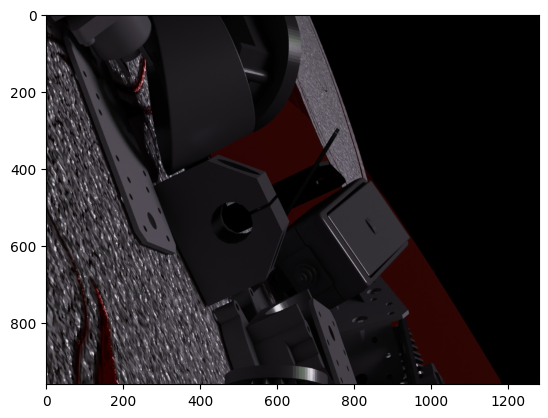

In [14]:
data_path = ITODD_BOP_PATH / 'train_pbr'

scene_id, img_id = 0, 130
img = read_img(data_path, scene_id, img_id)
plt.imshow(img)

In [15]:
masks_subdir = 'mask'
masks_subdir = 'mask_visib'
n_objs = 25
masks = read_masks(data_path, scene_id, masks_subdir, img_id, n_objs)

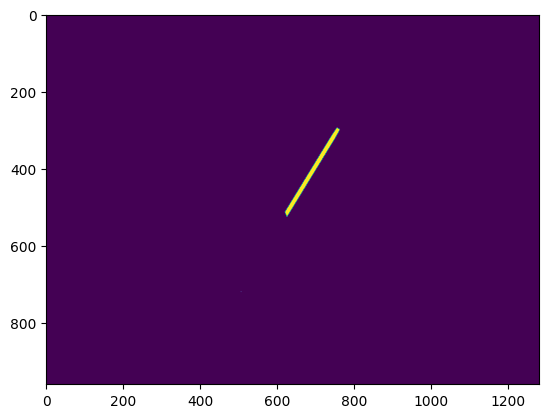

In [16]:
i = 2
plt.imshow(masks[i])

In [17]:
mask = masks[0]
mask.shape, mask.min(), mask.max(), mask.dtype

((960, 1280), 0, 255, dtype('uint8'))

In [18]:
dfm = ds.df_img.iloc[:10]
dfm

,scene_id,img_id,cam_depth_scale,img_width,img_height,cam_K
img_ds_id,,,,,,
25350,25,350,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
341,0,341,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
37097,37,97,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
27990,27,990,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
900,0,900,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
44331,44,331,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
41243,41,243,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
38528,38,528,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
20616,20,616,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."


In [19]:
dfm.iloc[0]['cam_K']

array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
       [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [20]:
img_sz = dfm[['img_width', 'img_height']].max(axis=1)
img_sz

img_ds_id
25350    1280
341      1280
37097    1280
27990    1280
900      1280
44331    1280
41243    1280
38528    1280
20616    1280
16369    1280
dtype: int64

In [21]:
ids = np.arange(1000)
np.random.seed(1)
np.random.shuffle(ids)
ids = ids[:100]
dfo = ds.df_obj.loc[ids]
n = len(dfo)
dfo = dfo[dfo['px_count_visib'] > 0]
print(f'{n} --> {len(dfo)}')
bbox_ltwh = np.stack(dfo['bbox_visib_ltwh'])
assert bbox_ltwh.min() >= 0
dfi = ds.df_img.loc[dfo['img_ds_id']]
img_sz = dfi[['img_width', 'img_height']].max(axis=1)
bbox_ltwh = np.stack(dfo['bbox_visib_ltwh'])
bbox_sz = bbox_ltwh[:, 2:].min(axis=1)
inds = bbox_sz / img_sz.values >= 0.02
dfo, dfi = dfo[inds], dfi[inds]
dfo, dfi


100 --> 47


(           img_ds_id  obj_ind  obj_id  px_count_all  px_count_valid  \
 obj_ds_id                                                             
 507               20        7      27         26385           26385   
 818               32       18      19         36289           36289   
 810               32       10      18         86981           86981   
 318               12       18      27         59181           16518   
 968               38       18      19         30971           30971   
 345               13       20      26         36868           36868   
 104                4        4       9        168276           96320   
 472               18       22      21        111444            8562   
 433               17        8      17         93350           14586   
 119                4       19      10         17555           17555   
 647               25       22      10         19747           19747   
 910               36       10      18         91491           6

In [22]:
imgs_view, objs_view = ds.get_imgs_view(), ds.get_objs_view(1)
len(imgs_view), len(ds.df_obj), len(objs_view)

(50000, 1246325, 16071)

In [23]:
n = 100
inds = np.arange(n)
vals = [0] * n
for i in inds:
    gt = objs_view.get_gt_imgs_masks(i, 1)
    dfo = gt.df_obj
    mask = gt.masks[0]
    # plt.imshow(mask)
    # print(dfo[['bbox_obj_ltwh', 'bbox_visib_ltwh', 'px_count_all', 'px_count_valid', 'px_count_visib', 'visib_fract']])
    bbox_ltwh, px_count_visib, visib_fract = dfo['bbox_visib_ltwh'].item(), dfo['px_count_visib'].item(), dfo['visib_fract'].item()
    bbox_w_fract = bbox_ltwh[2] / mask.shape[1]
    bbox_h_fract = bbox_ltwh[3] / mask.shape[0]
    px_fract = px_count_visib / np.prod(mask.shape[:2])
    print(f'bbox_w_fract = {bbox_w_fract:.4f}. bbox_h_fract = {bbox_h_fract:.4f}. px_fract = {px_fract:.4f}')
    vals[i] = px_fract
dfiv = pd.DataFrame({'ind': inds, 'w_fract': bbox_w_fract, 'h_fract': bbox_h_fract, 'f': vals})
dfiv

bbox_w_fract = 0.1375. bbox_h_fract = 0.1969. px_fract = 0.0144
bbox_w_fract = 0.1328. bbox_h_fract = 0.2000. px_fract = 0.0161
bbox_w_fract = 0.1930. bbox_h_fract = 0.2521. px_fract = 0.0357
bbox_w_fract = 0.0906. bbox_h_fract = 0.1906. px_fract = 0.0113
bbox_w_fract = 0.2055. bbox_h_fract = 0.1594. px_fract = 0.0254
bbox_w_fract = 0.2492. bbox_h_fract = 0.3396. px_fract = 0.0448
bbox_w_fract = 0.1719. bbox_h_fract = 0.3698. px_fract = 0.0391
bbox_w_fract = 0.1781. bbox_h_fract = 0.2896. px_fract = 0.0368
bbox_w_fract = 0.1844. bbox_h_fract = 0.1760. px_fract = 0.0219
bbox_w_fract = 0.1766. bbox_h_fract = 0.2521. px_fract = 0.0309
bbox_w_fract = 0.1492. bbox_h_fract = 0.2552. px_fract = 0.0095
bbox_w_fract = 0.0570. bbox_h_fract = 0.0698. px_fract = 0.0024
bbox_w_fract = 0.2039. bbox_h_fract = 0.2271. px_fract = 0.0267
bbox_w_fract = 0.1992. bbox_h_fract = 0.2219. px_fract = 0.0171
bbox_w_fract = 0.1313. bbox_h_fract = 0.0781. px_fract = 0.0060
bbox_w_fract = 0.0875. bbox_h_fract = 0.

,ind,w_fract,h_fract,f
0,0,0.110937,0.2,0.014431
1,1,0.110937,0.2,0.016112
2,2,0.110937,0.2,0.035670
3,3,0.110937,0.2,0.011320
4,4,0.110937,0.2,0.025357
...,...,...,...,...
95,95,0.110937,0.2,0.017751
96,96,0.110937,0.2,0.022476
97,97,0.110937,0.2,0.029068
98,98,0.110937,0.2,0.011111


In [24]:
dfiv.sort_values('f', inplace=True)
dfiv.iloc[:20]

,ind,w_fract,h_fract,f
90,90,0.110937,0.2,0.001021
59,59,0.110937,0.2,0.001372
32,32,0.110937,0.2,0.002378
11,11,0.110937,0.2,0.002408
66,66,0.110937,0.2,0.003522
61,61,0.110937,0.2,0.005017
14,14,0.110937,0.2,0.005990
30,30,0.110937,0.2,0.006204
18,18,0.110937,0.2,0.007243
93,93,0.110937,0.2,0.008188


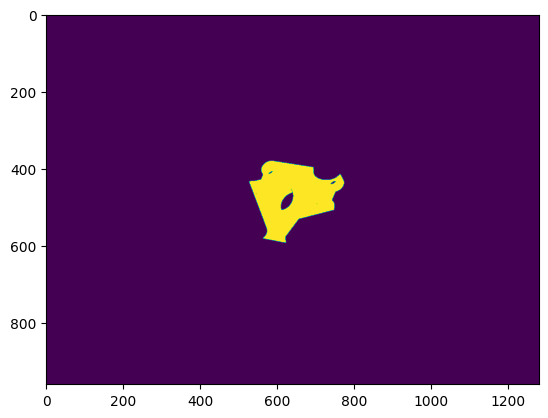

In [25]:
gt = objs_view.get_gt_imgs_masks(22, 1)
plt.imshow(gt.masks[0])

In [26]:
ov = ds.get_objs_view(obj_ids=1, out_size=512)
len(ov)

16071

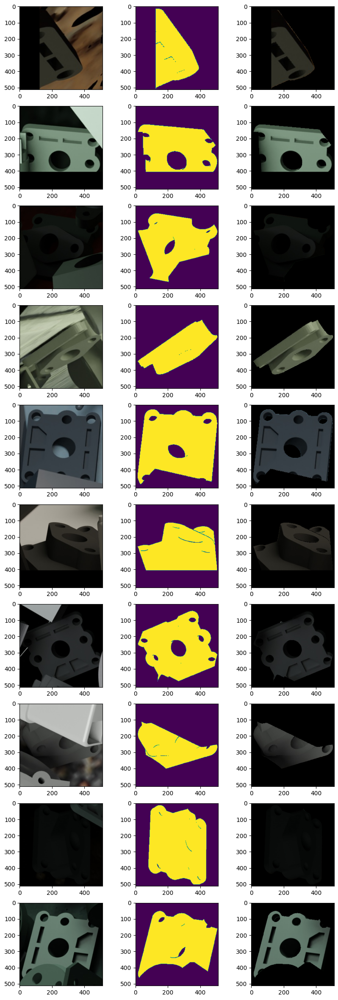

In [27]:
ind = 20
n = 10
gt = ov.get_gt_imgs_masks(ind, n)
fig, axes = plt.subplots(n, 3)
fig.set_figwidth(10)
fig.set_figheight(30)
for i in range(n):
    img_crop, mask_crop = gt.imgs_crop[i], gt.masks_crop[i]
    img_masked = np.zeros_like(img_crop)
    m = mask_crop > 0
    img_masked[m] = img_crop[m]
    axes[i, 0].imshow(img_crop)
    axes[i, 1].imshow(mask_crop)
    axes[i, 2].imshow(img_masked)

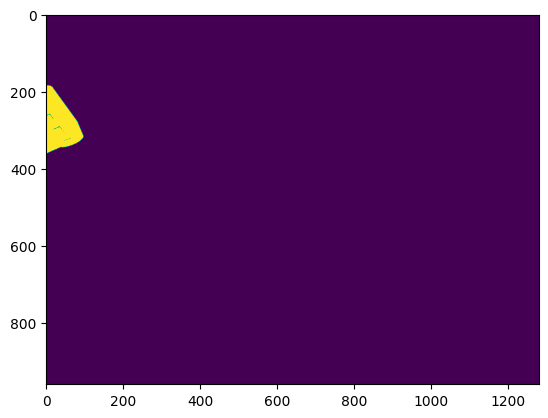

In [28]:
plt.imshow(gt.masks[0])

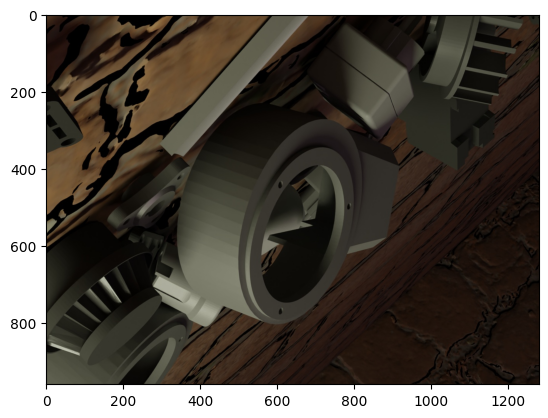

In [29]:
plt.imshow(gt.imgs[0])


In [15]:
from datetime import datetime as dt
from sdp.ds.bop_dataset import AUGNAME_DEFAULT

In [31]:
ov.set_batch_size(10)
n = 10
t1 = dt.now()
for i in range(n):
    b = ov.get_gt_batch(i)
t2 = dt.now()
print(f'n = {n}. Avg time: {(t2 - t1).total_seconds() / n:.03} sec.')

n = 10. Avg time: 0.362 sec.


In [32]:
ov.set_batch_size(10)
n = 10
t1 = dt.now()
for b in ov.get_batch_iterator(n, aug_name=AUGNAME_DEFAULT): 
    print(len(b.imgs))
t2 = dt.now()
print(f'n = {n}. Avg time: {(t2 - t1).total_seconds() / n:.03} sec.')

10
10
10
10
10
10
10
10
10
10
n = 10. Avg time: 0.792 sec.


In [54]:
multiprocess = False
multiprocess = True
aug_name = AUGNAME_DEFAULT
# aug_name = None
# return_tensors, keep_source_mages, keep_cropped_images = False, True, True
return_tensors, keep_source_mages, keep_cropped_images = True, False, False
ov = ds.get_objs_view(1, out_size=512, aug_name=aug_name)
n_batches = 1000
batch_size = 10
batch_it = ov.get_batch_iterator(
    n_batches, batch_size=batch_size, multiprocess=multiprocess, buffer_sz=15,
    return_tensors=return_tensors, keep_source_images=keep_source_mages, keep_cropped_images=keep_cropped_images)


min_mask_ratio: 20671 --> 18066
min_bbox_dim_ratio: 18066 --> 16071


In [55]:

t1 = dt.now()
n = 20
for i in range(n):
    b = next(batch_it)
    print(i, len(b.imgs), len(b.imgs_crop_tn))
t2 = dt.now()
print(f'n = {n}. Avg time: {(t2 - t1).total_seconds() / n:.03} sec.')

Batch 2 error


TypeError: GtImgsMasks.__init__() missing 1 required positional argument: 'maps'


AttributeError: 'BatchResultContainer' object has no attribute 'tb_str'

(array(3), array([1, 2]), array([1, 2, 3, 4]))

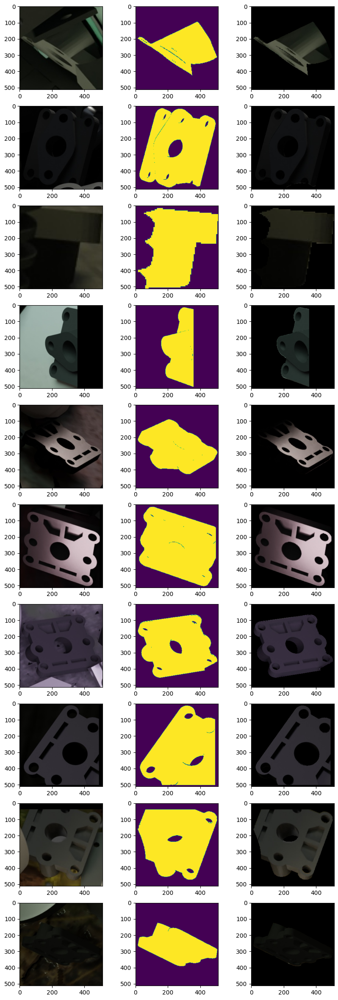

In [35]:
ind = 20
n = 10
gt = batches[1]
fig, axes = plt.subplots(n, 3)
fig.set_figwidth(10)
fig.set_figheight(30)
for i in range(n):
    img_crop, mask_crop = gt.imgs_crop[i], gt.masks_crop[i]
    img_masked = np.zeros_like(img_crop)
    m = mask_crop > 0
    img_masked[m] = img_crop[m]
    axes[i, 0].imshow(img_crop)
    axes[i, 1].imshow(mask_crop)
    axes[i, 2].imshow(img_masked)

In [36]:
import imgaug.augmenters as iaa

In [37]:
# One of
aug = iaa.Add((-50, 100))
aug = iaa.Add((-50, 100), per_channel=True)
aug = iaa.Multiply((0.8, 1.8))
# Sequence
aug = iaa.GaussianBlur(sigma=(5, 5))
# aug = iaa.LinearContrast((0.5, 1.5))
# aug = iaa.LinearContrast((0.5, 0.5))
# aug = iaa.LinearContrast((1.5, 1.5))
# aug = iaa.AdditiveGaussianNoise(loc=0, scale=(0, 15))

# aug = iaa.Sequential([
#     iaa.OneOf([
#         iaa.Add((-50, 100)),
#         iaa.Add((-50, 100), per_channel=True),
#         iaa.Multiply((0.8, 1.8)),
#     ]),
#     iaa.GaussianBlur(sigma=(5, 5)),
#     iaa.LinearContrast((0.5, 1.5)),
#     iaa.AdditiveGaussianNoise(loc=0, scale=(0, 15)),
# ], random_order=True)


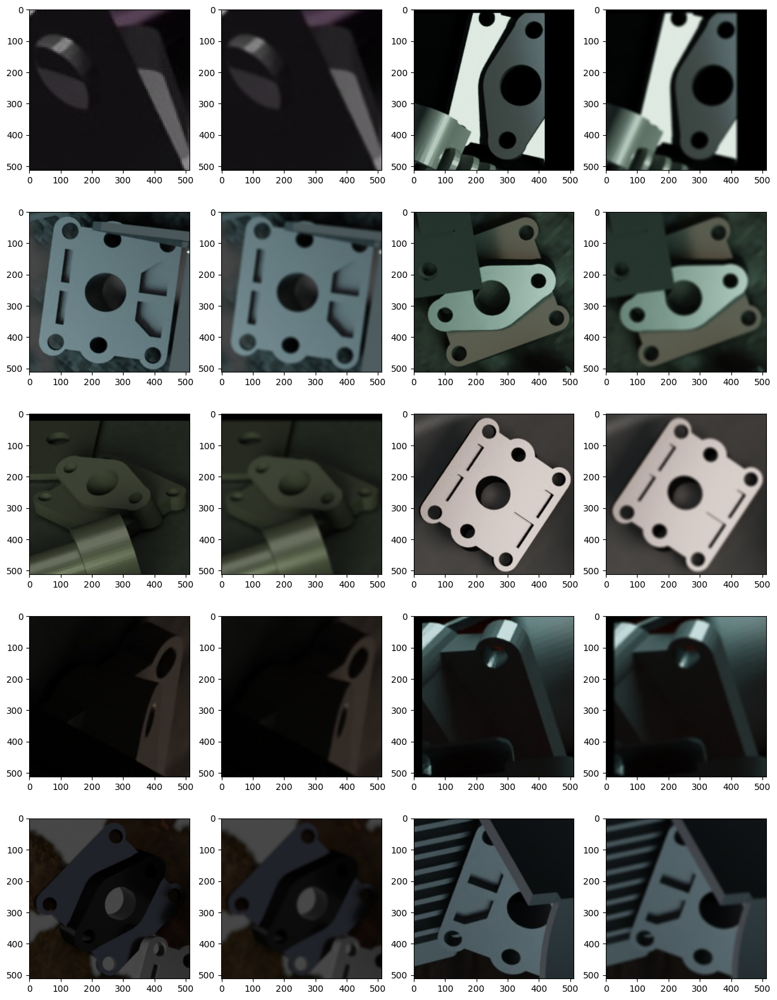

In [38]:
i_batch = 0
imgs = batches[i_batch].imgs_crop
# imgs_aug = aug(images=imgs)
n = len(imgs)
nrows = n // 2
fig, axes = plt.subplots(nrows, 4)
fig.set_figwidth(15)
fig.set_figheight(20)
for i in range(n):
    img = imgs[i]
    # img_aug = imgs_aug[i]
    img_aug = aug(images=[img])[0]
    ir, ic = i % nrows, i // nrows
    axes[ir, 2 * ic].imshow(img)
    axes[ir, 2 * ic + 1].imshow(img_aug)


In [39]:
from sdp.ds.maps_gen import gen_noc_norms, NocNormsParams


objc[15835]: Class GLFWApplicationDelegate is implemented in both /Users/misha/miniconda3/envs/sdp_py310/lib/python3.10/site-packages/open3d/cpu/pybind.cpython-310-darwin.so (0x12cb43cb8) and /usr/local/Cellar/glfw/3.3.8/lib/libglfw.3.3.dylib (0x141c96790). One of the two will be used. Which one is undefined.
objc[15835]: Class GLFWWindowDelegate is implemented in both /Users/misha/miniconda3/envs/sdp_py310/lib/python3.10/site-packages/open3d/cpu/pybind.cpython-310-darwin.so (0x12cb43c40) and /usr/local/Cellar/glfw/3.3.8/lib/libglfw.3.3.dylib (0x141c967b8). One of the two will be used. Which one is undefined.
objc[15835]: Class GLFWContentView is implemented in both /Users/misha/miniconda3/envs/sdp_py310/lib/python3.10/site-packages/open3d/cpu/pybind.cpython-310-darwin.so (0x12cb43ce0) and /usr/local/Cellar/glfw/3.3.8/lib/libglfw.3.3.dylib (0x141c96808). One of the two will be used. Which one is undefined.
objc[15835]: Class GLFWWindow is implemented in both /Users/misha/miniconda3/env

In [40]:
params = NocNormsParams(1, ITODD_BOP_PATH, 'models', np.arange(30))
gen_noc_norms(params)

Reading dataset from /Users/misha/data/bop/itodd/.sdp/v0.0.1


In [42]:
ds.df_img.iloc[100]['cam_K'], ds.df_img.iloc[400]['cam_K']

(array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
        [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
 array([[2.99214000e+03, 0.00000000e+00, 6.33411987e+02],
        [0.00000000e+00, 3.00349000e+03, 4.89881989e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]))

In [125]:
ds1 = BopDataset.from_dir(BOP_PATH, 'itodd', 'train_pbr', shuffle=False)
ov1 = ds1.get_objs_view(-1, out_size=512, aug_name=aug_name)


Reading dataset from /Users/misha/data/bop/itodd/.sdp/v0.0.1
min_mask_ratio: 619158 --> 564395
min_bbox_dim_ratio: 564395 --> 510638


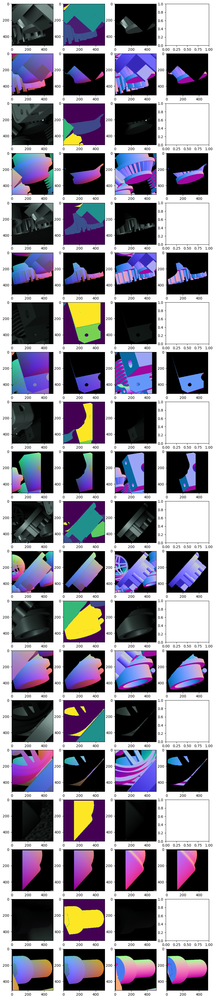

: 

In [126]:
ind = 0
n = 10
ids = sorted(ov1.ids)[ind:ind + n]
gt = ov1.get_gt_imgs_masks(ids, is_ids=True)
fig, axes = plt.subplots(n * 2, 4)
fig.set_figwidth(10)
fig.set_figheight(50)
for i in range(len(gt.imgs_crop)):
    img_crop, mask_crop = gt.imgs_crop[i], gt.masks_crop[i]
    map_noc_crop, map_norm_crop = gt.maps_crop['noc'][i], gt.maps_crop['norm'][i]
    img_masked = np.zeros_like(img_crop)
    map_noc_masked, map_norm_masked = np.zeros_like(img_crop), np.zeros_like(img_crop)
    m = mask_crop == gt.df_obj.iloc[i]['obj_ind'] + 1
    img_masked[m] = img_crop[m]
    map_noc_masked[m] = map_noc_crop[m]
    map_norm_masked[m] = map_norm_crop[m]

    axes[2 * i, 0].imshow(img_crop)
    axes[2 * i, 1].imshow(mask_crop)
    axes[2 * i, 2].imshow(img_masked)
    axes[2 * i + 1, 0].imshow(map_noc_crop)
    axes[2 * i + 1, 1].imshow(map_noc_masked)
    axes[2 * i + 1, 2].imshow(map_norm_crop)
    axes[2 * i + 1, 3].imshow(map_norm_masked)
    

In [98]:
dfo = ds1.df_obj
ids = ov1.ids
bboxes = dfo.loc[ids]['bbox_visib_ltwh']
bboxes = np.stack(bboxes.values)

In [99]:
inds = bboxes[:, 0] == -1
bboxes[inds, :]

array([], shape=(0, 4), dtype=float64)

In [102]:
len(ov1.ids), len(ds.df_obj)

(16071, 1246325)

In [105]:
ids = sorted(ov1.ids)[ind:ind + n]
dfo = ds.df_obj.loc[ids]
ds1.df_img.loc[dfo['img_ds_id']]

,scene_id,img_id,cam_depth_scale,img_width,img_height,cam_K
img_ds_id,,,,,,
31,0,31,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
76,0,76,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
76,0,76,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
77,0,77,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
78,0,78,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
80,0,80,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
81,0,81,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
83,0,83,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."
84,0,84,0.1,1280,960,"[[2992.14, 0.0, 633.4119874238968], [0.0, 3003..."


In [112]:
irow = dfi.iloc[0]
width, height, cam_mat = irow['img_width'], irow['img_height'], irow['cam_K']
print(f'width = {width}. height = {height}')
print(cam_mat)

width = 1280. height = 960
[[2.99214000e+03 0.00000000e+00 6.33411987e+02]
 [0.00000000e+00 3.00349000e+03 4.89881989e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [120]:
n, f = 0.01, 10.0
fx, fy = cam_mat[0, 0], cam_mat[1, 1]
cx, cy = cam_mat[:2, 2]
cxx, cyy = width - cx, height - cy
off_x, off_y = 0, 0
if cx > cxx:
    ww = np.ceil(2 * cx).astype(int)
    off_x = 0
else:
    ww = np.ceil(2 * cxx).astype(int)
    off_x = ww - width
if cy > cyy:
    hh = np.ceil(2 * cy).astype(int)
    off_y = 0
else:
    hh = np.ceil(2 * cyy).astype(int)
    off_y = hh - height

print(off_x, off_y, ww, hh)


ww_half, hh_half = max(cx, width - cx), max(cy, height - cy)
print(f'ww_half = {ww_half}, hh_half = {hh_half}')
ww_half, hh_half = np.ceil(ww_half).astype(int), np.ceil(hh_half).astype(int)
print(f'ww_half = {ww_half}, hh_half = {hh_half}')
ww, hh = ww_half * 2, hh_half * 2
print(f'ww = {ww}, hh = {hh}')
rx, ry = n / fx, n / fy
l, r = -ww / 2 * rx, ww / 2 * rx
b, t = -hh / 2 * ry, hh / 2 * ry
res = np.array([
    [2 * n / (r - l), 0, (r + l) / (r - l), 0],
    [0, 2 * n / (t - b), (t + b) / (t - b), 0],
    [0, 0, -(f + n) / (f - n), -2 * f * n / (f - n)],
    [0, 0, -1, 0],
])
res

14 0 1294 980
ww_half = 646.5880125761032, hh_half = 489.8819887638092
ww_half = 647, hh_half = 490
ww = 1294, hh = 980


array([[ 4.62463679,  0.        ,  0.        ,  0.        ],
       [ 0.        ,  6.12957143,  0.        ,  0.        ],
       [ 0.        ,  0.        , -1.002002  , -0.02002002],
       [ 0.        ,  0.        , -1.        ,  0.        ]])

In [116]:
ww_half, hh_half, np.ceil(ww_half).astype(int), np.ceil(hh_half).astype(int)

(646.5880125761032, 489.8819887638092, 647, 490)

In [ ]:
objs_view = ds.get_objs_view(-1, 10, out_size=512, return_tensors=True, keep_source_images=False, keep_cropped_images=False)
n = 100
inds = np.arange(n)
vals = [0] * n
for i in inds:
    gt = objs_view.get_gt_imgs_masks(i, 1)
    dfo = gt.df_obj
    mask = gt.masks[0]
    # plt.imshow(mask)
    # print(dfo[['bbox_obj_ltwh', 'bbox_visib_ltwh', 'px_count_all', 'px_count_valid', 'px_count_visib', 'visib_fract']])
    bbox_ltwh, px_count_visib, visib_fract = dfo['bbox_visib_ltwh'].item(), dfo['px_count_visib'].item(), dfo['visib_fract'].item()
    bbox_w_fract = bbox_ltwh[2] / mask.shape[1]
    bbox_h_fract = bbox_ltwh[3] / mask.shape[0]
    px_fract = px_count_visib / np.prod(mask.shape[:2])
    print(f'bbox_w_fract = {bbox_w_fract:.4f}. bbox_h_fract = {bbox_h_fract:.4f}. px_fract = {px_fract:.4f}')
    vals[i] = px_fract
dfiv = pd.DataFrame({'ind': inds, 'w_fract': bbox_w_fract, 'h_fract': bbox_h_fract, 'f': vals})
dfiv